### Set Up

In [0]:
# Install missing dependencies
%pip install mlflow
%pip install ucimlrepo

Python interpreter will be restarted.
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Not uninstalling typing-extensions at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-df973154-d2fe-4065-8c1b-c3d393d49732
    Can't uninstall 'typing-extensions'. No files were found to uninstall.
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Not uninstalling requests at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-df973154-d2fe-4065-8c1b-c3d393d49732
    Can't uninstall 'requests'. No files were found to uninstall.
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.0.1
    Not uninstalling markupsafe at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-df973154-d2fe-4065-8c1b-c3d393d4973

In [0]:
import os
import pyspark
from pyspark.sql import SparkSession
from functools import reduce
from pyspark.sql import DataFrame
import pyspark.sql.functions as F
from pyspark.sql.functions import col, when, unix_timestamp, dayofweek, dayofmonth, udf, hour, minute, unix_timestamp, concat_ws
from IPython.display import Image, display
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from pyspark.sql.types import IntegerType, NumericType, StringType, FloatType, DoubleType

from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression, RandomForestRegressor, GBTRegressor
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.stat import Correlation

import mlflow
import mlflow.pyspark.ml

In [0]:
# Start Spark Session
spark = SparkSession.builder.appName("Predict price") \
    .config("spark.driver.memory", "8g") \
    .getOrCreate()

In [0]:
# Load the dataset
data = spark.read.parquet('/FileStore/tables/clean/df_projeto_clean.parquet').limit(1000000)

In [0]:
# Check the data (number of rows, schema)
print(data.count())
data.printSchema()

1000000
root
 |-- VendorID: string (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: string (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: double (nullable = true)
 |-- PULocationID: string (nullable = true)
 |-- DOLocationID: string (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- Airport_fee: integer (nullable = true)
 |-- is_weekend: integer (nullable = true)
 |-- is_holiday: integer (nullable = true)
 |-- pickup_hour_decimal: double (nullable = true)
 |-- trip_duration_minutes: double 

In [0]:
data.display()

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,is_weekend,is_holiday,pickup_hour_decimal,trip_duration_minutes,trip_speed_mph,is_shared_ride,has_toll,PU_DO_pair
1,2023-05-01T00:42:49.000+0000,2023-05-01T01:11:18.000+0000,2.0,8.1,1.0,138,262,1,35.9,10.25,0.5,9.5,0.0,1.0,57.15,2.5,1,0,0,0.7,28.483333333333334,17.062609713282622,1,0,138-262
1,2023-05-01T00:56:34.000+0000,2023-05-01T01:13:39.000+0000,2.0,9.1,1.0,138,141,1,35.2,10.25,0.5,10.7,6.55,1.0,64.2,2.5,1,0,0,0.9333333333333333,17.083333333333332,31.960975609756098,1,1,138-141
2,2023-05-01T00:00:52.000+0000,2023-05-01T00:20:12.000+0000,1.0,8.21,1.0,138,140,1,33.1,6.0,0.5,2.24,0.0,1.0,47.09,2.5,1,0,0,0.0,19.333333333333332,25.479310344827592,0,0,138-140
2,2023-05-01T00:50:34.000+0000,2023-05-01T01:12:09.000+0000,1.0,9.05,1.0,138,116,1,38.0,6.0,0.5,10.76,6.55,1.0,64.56,0.0,1,0,0,0.8333333333333334,21.583333333333332,25.15830115830116,0,1,138-116
1,2023-05-01T00:13:58.000+0000,2023-05-01T00:18:10.000+0000,1.0,0.7,1.0,161,48,1,6.5,3.5,0.5,2.85,0.0,1.0,14.35,2.5,0,0,0,0.21666666666666667,4.2,9.999999999999998,0,0,161-48
2,2023-04-30T23:48:31.000+0000,2023-04-30T23:57:35.000+0000,1.0,2.38,1.0,249,231,2,12.1,1.0,0.5,0.0,0.0,1.0,17.1,2.5,0,1,0,23.8,9.066666666666666,15.75,0,0,249-231
2,2023-05-01T00:28:47.000+0000,2023-05-01T00:39:33.000+0000,1.0,2.92,1.0,114,230,2,14.9,1.0,0.5,0.0,0.0,1.0,19.9,2.5,0,0,0,0.4666666666666667,10.766666666666667,16.272445820433436,0,0,114-230
2,2023-05-01T00:18:49.000+0000,2023-05-01T00:43:41.000+0000,1.0,14.29,1.0,138,13,1,54.1,6.0,0.5,12.82,0.0,1.0,78.67,2.5,1,0,0,0.3,24.866666666666667,34.4798927613941,0,0,138-13
1,2023-05-01T00:52:48.000+0000,2023-05-01T01:17:35.000+0000,1.0,11.3,1.0,132,129,1,45.0,1.0,0.5,6.0,0.0,1.0,53.5,0.0,0,0,0,0.8666666666666667,24.783333333333335,27.357094821788838,0,0,132-129
2,2023-05-01T00:55:22.000+0000,2023-05-01T00:58:20.000+0000,1.0,1.19,1.0,230,100,1,7.2,1.0,0.5,2.44,0.0,1.0,14.64,2.5,0,0,0,0.9166666666666666,2.966666666666667,24.06741573033708,0,0,230-100


In [0]:
# features with string datatypes can be turned to integers (except PU_DP_pair) 
[f[0] for f in data.dtypes if isinstance(data.schema[f[0]].dataType, (StringType))]

Out[6]: ['VendorID',
 'passenger_count',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'PU_DO_pair']

In [0]:
# Extract day of week and hour features, change datatypes to integer values
df = data.withColumn("hour", hour("tpep_pickup_datetime")) \
    .withColumn("day_of_week", dayofweek("tpep_pickup_datetime")) 
    
for string_col in ['VendorID', 'passenger_count', 'PULocationID', 'DOLocationID', 'payment_type']:
    df = df.withColumn(string_col, col(string_col).cast("int"))

# check that dtypes ok
[f[0] for f in df.dtypes if isinstance(df.schema[f[0]].dataType, (StringType))]

In [0]:
# RatecodeID can be changed to integer values as well
print(df.groupBy("RatecodeID").count().show())
df = df.withColumn('RatecodeID', col('RatecodeID').cast("int"))

In [0]:
# we notice that improvement_surcharge, mta_tax, congestion_surcharge are categorical -> we use stringIndexer
print(df.groupBy("improvement_surcharge").count().show())
print(df.groupBy("mta_tax").count().show())
print(df.groupBy("congestion_surcharge").count().show())

+--------------------+--------+
|congestion_surcharge|   count|
+--------------------+--------+
|                 2.5|60369545|
|                 0.0| 2888102|
|                2.52|       1|
|                2.75|      12|
+--------------------+--------+

None


In [0]:
for num_col in ['mta_tax', 'improvement_surcharge', 'congestion_surcharge']:
    df = df.withColumn(num_col, col(num_col).cast("string")) 
    stringIndexer = StringIndexer(inputCol=num_col, outputCol=f'{num_col}_indexed')
    df = stringIndexer.fit(df).transform(df)
    df = df.withColumn(f'{num_col}_indexed', col(f'{num_col}_indexed').cast("int")) 

In [0]:
number_of_nulls = df.filter(
    reduce(lambda x, y: x | y, [col(c).isNull() for c in df.columns])
).count()
print(number_of_nulls)
df = df.dropna()

104


In [0]:
# substract tip_amount
df = df.withColumn("total_amount", col("total_amount") - col("tip_amount")).drop("tip_amount")

## EDA

### Categorical features

In [0]:
categorical_features = [f[0] for f in df.dtypes if isinstance(df.schema[f[0]].dataType, (StringType, IntegerType))]
categorical_features

Out[12]: ['VendorID',
 'passenger_count',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'mta_tax',
 'improvement_surcharge',
 'congestion_surcharge',
 'Airport_fee',
 'is_weekend',
 'is_holiday',
 'is_shared_ride',
 'has_toll',
 'PU_DO_pair',
 'hour',
 'day_of_week',
 'mta_tax_indexed',
 'improvement_surcharge_indexed',
 'congestion_surcharge_indexed']

In [0]:
# Remove 'mta_tax', 'improvement_surcharge', 'congestion_surcharge' and use indexed versions; remove PU_DO_pairs as well
categorical_features = ['VendorID',
 'passenger_count',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'Airport_fee',
 'is_weekend',
 'is_holiday',
 'is_shared_ride',
 'has_toll',
 'hour',
 'day_of_week',
 'mta_tax_indexed',
 'improvement_surcharge_indexed',
 'congestion_surcharge_indexed']

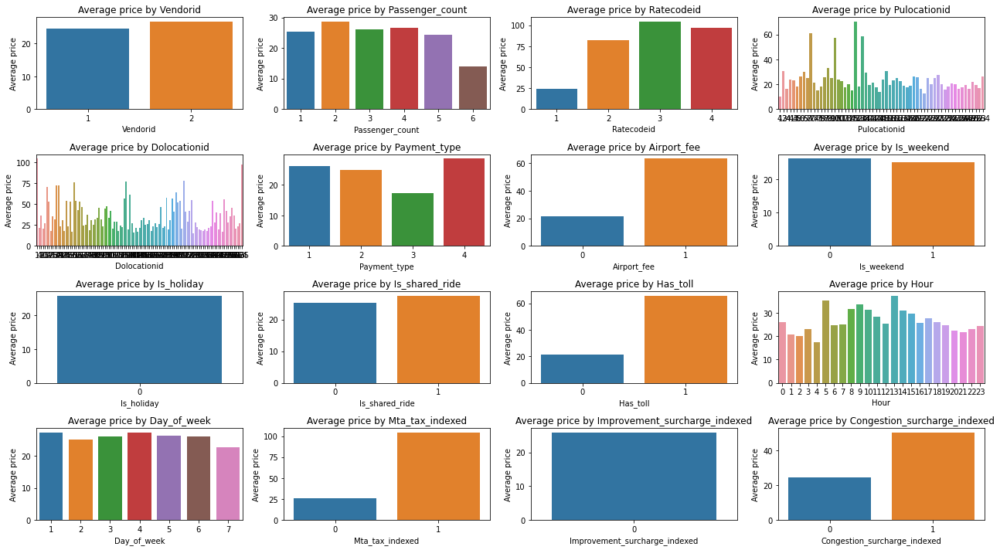

In [0]:
# EDA: categorical features
pd_df = df.sample(withReplacement=False, fraction=0.001, seed=42).toPandas()
# Set up the figure for multiple bar plots
fig, axes = plt.subplots(4, 4, figsize=(18, 10))
axes = axes.flatten()

# Plot each categorical feature against the mean count
for i, feature in enumerate(categorical_features):
    plot_df = pd_df.groupby(feature)[['total_amount']].mean().reset_index()
    sns.barplot(data=pd_df, x=feature, y="total_amount", ax=axes[i], estimator=np.mean, ci=None)
    axes[i].set_title(f"Average price by {feature.capitalize()}")
    axes[i].set_xlabel(feature.capitalize())
    axes[i].set_ylabel("Average price")

plt.tight_layout()
plt.show()

In [0]:
for feature in categorical_features:
    df.groupBy(feature).avg("total_amount").orderBy(feature).show()

+--------+------------------+
|VendorID| avg(total_amount)|
+--------+------------------+
|       1|23.210491148572707|
|       2| 26.61030121586805|
+--------+------------------+

+---------------+------------------+
|passenger_count| avg(total_amount)|
+---------------+------------------+
|            1.0|25.022825215957877|
|            2.0|26.133543521964977|
|            3.0|25.789468850539265|
|            4.0|27.272931008828014|
|            5.0|24.310354474814712|
|            6.0|24.165945727340088|
|            7.0| 73.78384615384616|
|            8.0|           67.5975|
|            9.0|           23.8375|
+---------------+------------------+

+------------+------------------+
|PULocationID| avg(total_amount)|
+------------+------------------+
|           1|  78.2623275862069|
|           3| 37.05280487804878|
|           4|22.413789566674165|
|           7|  21.8699165134422|
|           9| 37.17569892473118|
|          10| 75.58915467214973|
|          11| 41.4432183908045

Exclude: 
- 'is_weekend', 'is_holiday', 'improvement_surcharge' (no big differences on the average total_amount)
- 'PU_DO_pair' (we have PU and DO separately) 
- 'has_toll' (we have numeric column tolls_amount)
- 'is_shared_ride' (we have passenger_count)
 

In [0]:
# final categorical features
categorical_features = ['VendorID',
 'passenger_count',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'mta_tax_indexed',
 'congestion_surcharge_indexed',
 'Airport_fee',
 'hour',
 'day_of_week']

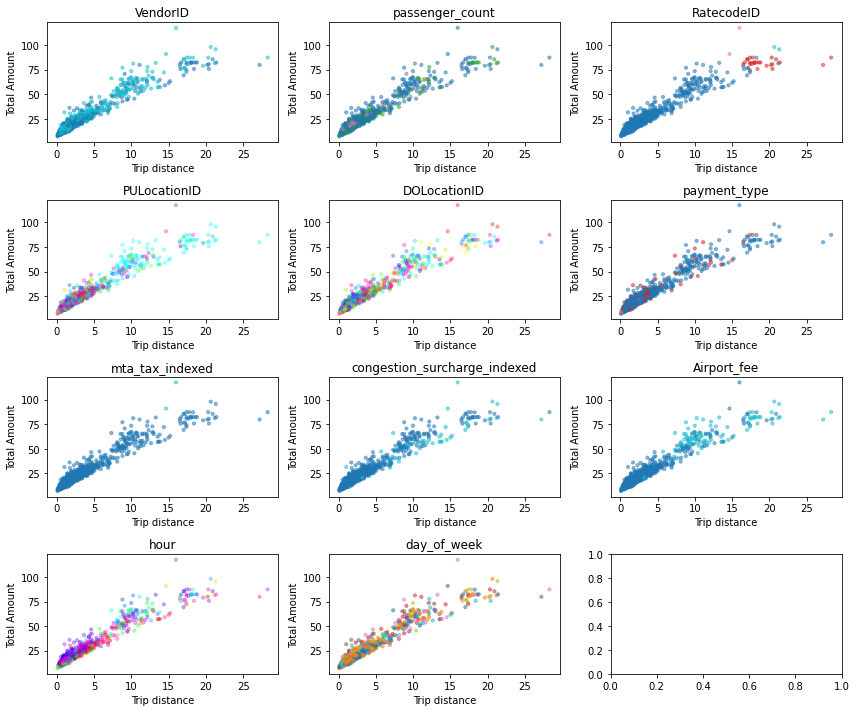

In [0]:
pandas_df = df.select(["trip_distance", "total_amount"] + categorical_features) \
              .sample(withReplacement=False, fraction=0.001, seed=42).toPandas()

# Set up the figure for multiple bar plots
fig, axes = plt.subplots(4, 3, figsize=(12, 10))
axes = axes.flatten()

# Plot each categorical feature against the mean count
for i, feature in enumerate(categorical_features):
    if pandas_df[feature].nunique() <= 10:
        axes[i].scatter(
        pandas_df['trip_distance'],
        pandas_df['total_amount'],
        c=pandas_df[feature],
        cmap='tab10',
        alpha=0.5,
        s=10)
    else:
        axes[i].scatter(
            pandas_df['trip_distance'],
            pandas_df['total_amount'],
            c=pandas_df[feature],
            cmap=plt.cm.get_cmap('hsv', pandas_df[feature].nunique()), 
            alpha=0.3,
            s=10)
    axes[i].set_title(f"{feature}")
    axes[i].set_xlabel('Trip distance')
    axes[i].set_ylabel("Total Amount")

# Remove empty subplot
fig.delaxes(axes[-1])
plt.tight_layout()
plt.show()

### Numerical features

In [0]:
numerical_features = [f[0] for f in df.dtypes if isinstance(df.schema[f[0]].dataType, DoubleType)]
numerical_features

Out[34]: ['trip_distance',
 'fare_amount',
 'extra',
 'tolls_amount',
 'total_amount',
 'pickup_hour_decimal',
 'trip_duration_minutes',
 'trip_speed_mph']

In [0]:
numerical_features =['trip_distance',
 'fare_amount',
 'extra',
 'tolls_amount',
 'pickup_hour_decimal',
 'trip_duration_minutes',
 'trip_speed_mph']

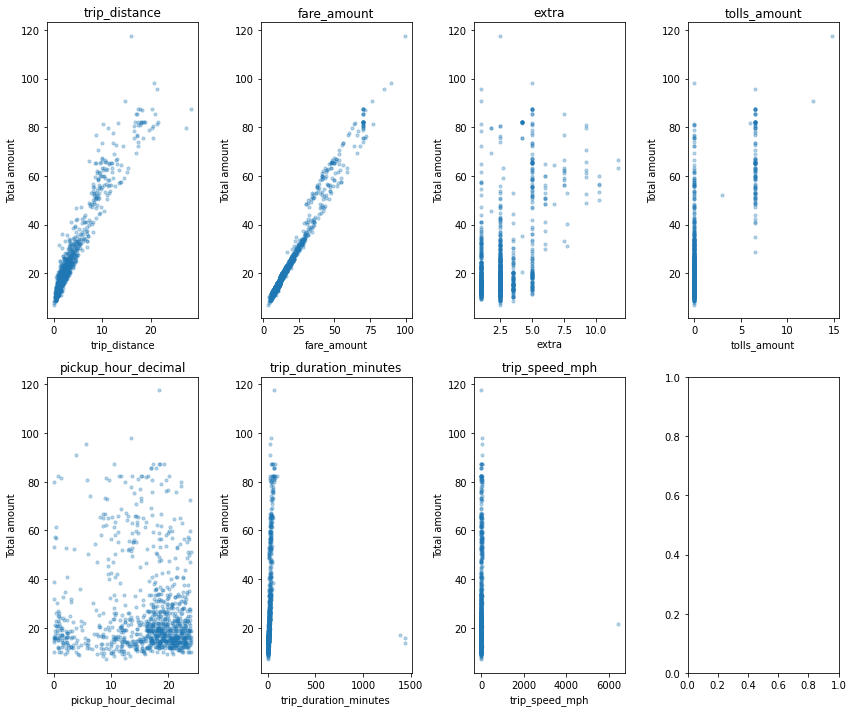

In [0]:
pandas_df = df.select(numerical_features + ['total_amount']) \
              .sample(withReplacement=False, fraction=0.001, seed=42).toPandas()

# Set up the figure for multiple bar plots
fig, axes = plt.subplots(2, 4, figsize=(12, 10))
axes = axes.flatten()

# Plot each categorical feature against the mean count
for i, feature in enumerate(numerical_features):
    axes[i].scatter(
            pandas_df[feature],
            pandas_df['total_amount'],
            alpha=0.3,
            s=10)
    axes[i].set_title(f"{feature}")
    axes[i].set_ylabel('Total amount')
    axes[i].set_xlabel(f"{feature}")

plt.tight_layout()
plt.show()

In [0]:
assembler = VectorAssembler(inputCols=numerical_features + ['total_amount'],
outputCol='features')
df_corr_matrix = assembler.transform(df)
corr_matrix = Correlation.corr(df_corr_matrix, "features", "pearson").head()[0]

In [0]:
# Convert Spark DenseMatrix to NumPy array
corr_array = corr_matrix.toArray()

# Create DataFrame for seaborn
columns = numerical_features + ['total_amount']
corr_df = pd.DataFrame(corr_array, columns=columns, index=columns)

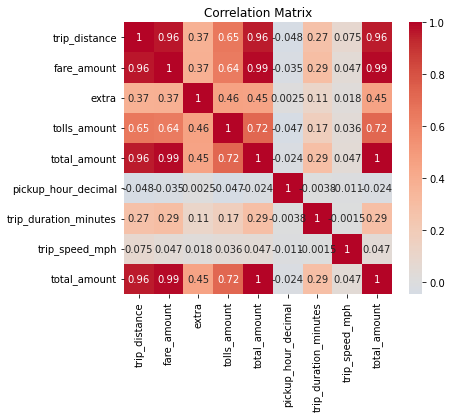

In [0]:
plt.figure(figsize=(6, 5))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()

- fare_amount: the time-and-distance fare
- keep only features with corr > 0.3

In [0]:
numerical_features =['trip_distance',
 'extra',
 'tolls_amount', 
 'trip_duration_minutes']

## Feature Engineering, Vectorization, Train-Test Split

In [0]:
# no need for indexer as all values doubles or integers
df.select(numerical_features+categorical_features).printSchema()

root
 |-- trip_distance: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- trip_duration_minutes: double (nullable = true)
 |-- VendorID: integer (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- mta_tax_indexed: integer (nullable = true)
 |-- congestion_surcharge_indexed: integer (nullable = true)
 |-- Airport_fee: integer (nullable = true)
 |-- hour: integer (nullable = true)
 |-- day_of_week: integer (nullable = true)



In [0]:
features = ['trip_distance'] # baseline
features2 = numerical_features 
features3 = categorical_features + numerical_features 

assembler = VectorAssembler(inputCols=features,
outputCol='features')

assembler2 = VectorAssembler(inputCols=features2, 
outputCol='features2')

assembler3 = VectorAssembler(inputCols=features3, 
outputCol='features3')

df = assembler.transform(df)
df = assembler2.transform(df)
df = assembler3.transform(df)

In [0]:
# Split data
train_data, val_data, test_data = df.select(['features', 'features2', 'features3', 'total_amount']).randomSplit([0.6, 0.2, 0.2], seed=42)
train_data.show(5, truncate=False)

+--------+----------------------------------+-----------------------------------------------------------------------------------+-----------------------------------------------------------------------+-------------------------------------------+------------+
|features|features2                         |features3                                                                          |features4                                                              |features5                                  |total_amount|
+--------+----------------------------------+-----------------------------------------------------------------------------------+-----------------------------------------------------------------------+-------------------------------------------+------------+
|[0.01]  |[0.01,1.0,0.0,0.05]               |[2.0,1.0,1.0,132.0,132.0,2.0,0.0,1.0,1.0,20.0,7.0,0.01,1.0,0.0,0.05]               |[2.0,1.0,132.0,132.0,0.0,1.0,1.0,20.0,0.01,1.0,0.0,0.05]               |[0.01,132.0,132.0,7.0,

In [0]:
# Evaluators
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")

## Linear Regression

In [0]:
# Define Linear Regression model # 6.9
mlflow.pyspark.ml.autolog() 

lr = LinearRegression(featuresCol="features_scaled", labelCol="total_amount")
scaler = StandardScaler(inputCol='features', outputCol="features_scaled")

with mlflow.start_run(run_name="LR_Baseline_Model"):
    # Train the model

    pipeline = Pipeline(stages=[scaler, lr])
    lr_model = pipeline.fit(train_data)

    # Make predictions
    predictions = lr_model.transform(val_data)

    # Evaluate model
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")
    predictions.select("features", "total_amount", "prediction").show(10)

    # Model coefficients and intercept
    print(f"Coefficients: {lr_model.stages[-1].coefficients}")
    print(f"Intercept: {lr_model.stages[-1].intercept}")

2025/05/20 17:45:11 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/20 17:46:13 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/56e3555547cb4708add4964e4fbf3027/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 


Root Mean Squared Error (RMSE): 5.235339373874034
R^2: 0.9172978521483673
MAE: 3.2421324457912624
+--------+------------+-----------------+
|features|total_amount|       prediction|
+--------+------------+-----------------+
|  [0.01]|         5.5|10.88198619315474|
|  [0.01]|         8.0|10.88198619315474|
|  [0.01]|        25.0|10.88198619315474|
|  [0.01]|         5.5|10.88198619315474|
|  [0.01]|        25.0|10.88198619315474|
|  [0.01]|         5.5|10.88198619315474|
|  [0.01]|       26.75|10.88198619315474|
|  [0.01]|        7.25|10.88198619315474|
|  [0.01]|        25.0|10.88198619315474|
|  [0.01]|         8.0|10.88198619315474|
+--------+------------+-----------------+
only showing top 10 rows



---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
File <command-587658695314628>:33
     30 predictions.select("features", "total_amount", "prediction").show(10)
     32 # Model coefficients and intercept
---> 33 print(f"Coefficients: {lr_model.coefficients}")
     34 print(f"Intercept: {lr_model.intercept}")

AttributeError: 'PipelineModel' object has no attribute 'coefficients'

In [0]:
mlflow.pyspark.ml.autolog() 

# Define Linear Regression model # 6.21
lr = LinearRegression(featuresCol="features2_scaled", labelCol="total_amount")
scaler = StandardScaler(inputCol='features2', outputCol="features2_scaled")

with mlflow.start_run(run_name="LR_Model_Numerical_Features"):
    # Train the model
    pipeline = Pipeline(stages=[scaler, lr])
    lr_model = pipeline.fit(train_data)

    # Make predictions
    predictions = lr_model.transform(val_data)

    # Evaluate model
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")
    predictions.select("features2", "total_amount", "prediction").show(10)

    # Model coefficients and intercept
    print(f"Coefficients: {lr_model.stages[-1].coefficients}")
    print(f"Intercept: {lr_model.stages[-1].intercept}")

2025/05/20 18:01:01 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/20 18:01:43 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/5286df377fcb4b81855823abd3434a33/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 


Root Mean Squared Error (RMSE): 4.450392782845036
R^2: 0.9402381827615794
MAE: 2.7915311232897464
+--------------------+------------+------------------+
|           features2|total_amount|        prediction|
+--------------------+------------+------------------+
| [0.01,1.0,0.0,0.05]|         5.5|10.553037056684147|
|[0.01,1.0,0.0,0.0...|         8.0|10.553327704539456|
|[0.01,1.0,0.0,0.0...|        25.0|10.553327704539456|
|[0.01,1.0,0.0,0.0...|         5.5|10.553618352394766|
|[0.01,1.0,0.0,0.0...|        25.0|10.553618352394766|
|[0.01,1.0,0.0,0.0...|         5.5|10.553618352394766|
|[0.01,1.0,0.0,0.0...|       26.75|10.553618352394766|
|  [0.01,1.0,0.0,0.1]|        7.25|10.553909000250076|
|  [0.01,1.0,0.0,0.1]|        25.0|10.553909000250076|
|[0.01,1.0,0.0,0.1...|         8.0|10.554199648105385|
+--------------------+------------+------------------+
only showing top 10 rows



---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
File <command-587658695314629>:32
     29 predictions.select("features2", "total_amount", "prediction").show(10)
     31 # Model coefficients and intercept
---> 32 print(f"Coefficients: {lr_model.coefficients}")
     33 print(f"Intercept: {lr_model.intercept}")

AttributeError: 'PipelineModel' object has no attribute 'coefficients'

## Random Forest

In [0]:
# RF pipeline
rf = RandomForestRegressor(featuresCol="features3", labelCol="total_amount")

# Grid search
rf_paramGrid = (
    ParamGridBuilder()
    .addGrid(rf.numTrees, [20, 50])
    .addGrid(rf.maxDepth, [3, 5])
    .addGrid(rf.maxBins, [16, 32])
    .build()
)

mlflow.pyspark.ml.autolog() 

rf_pipeline = Pipeline(stages = [rf])
rf_cv = CrossValidator(
    estimator=rf_pipeline,
    estimatorParamMaps=rf_paramGrid,
    evaluator=evaluator_rmse,
    numFolds=3
)

with mlflow.start_run(run_name="RF_Model"):
    rf_cv_model = rf_cv.fit(train_data)
    predictions = rf_cv_model.transform(val_data)

    # Log all tested parameter combinations
    for params, metric in zip(rf_cv_model.getEstimatorParamMaps(), rf_cv_model.avgMetrics):
        param_str = "_".join([f"{param.name}_{val}" for param, val in params.items()])
        mlflow.log_metric(f"cv_rmse_{param_str}", metric)

    # Evaluate 
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")

2025/05/21 12:10:11 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 12:10:47 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/2e40f0dbe58742c98e08ab95f0fdf754/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 
2025/05/21 12:10:56 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 12:11:30 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (mod

RMSE: 3.238014688404144
R^2: 0.9683637689464861
MAE: 1.916697749988453


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-1840003664670846>:35
     33 print(f"R^2: {r2}")
     34 print(f"MAE: {mae}")
---> 35 importances = model.featureImportances
     36 print(features)
     37 importances

NameError: name 'model' is not defined

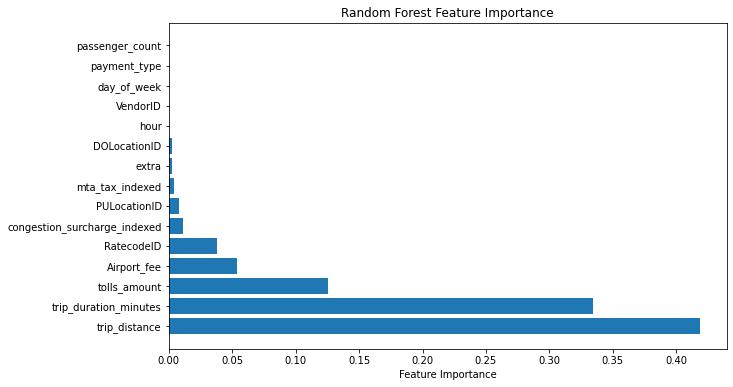

In [0]:
# Look into feature importance in random forest regression
best_rf_model = rf_cv_model.bestModel
rf_model = best_rf_model.stages[-1]

# Get feature importance from the Random Forest model
feature_importances = rf_model.featureImportances

# Sort features by importance
sorted_features = sorted(zip(features3, feature_importances), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_features)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(features, importances)
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importance")
plt.show()

## GBT Regression

In [0]:
# GBT pipeline
gbt = GBTRegressor(featuresCol="features3", labelCol="total_amount")
gbt_paramGrid = ParamGridBuilder().addGrid(gbt.maxDepth, [3, 5]).build()

# Create a Pipeline (gbt_pipeline)
gbt_pipeline = Pipeline(stages = [gbt])

mlflow.pyspark.ml.autolog() 

gbt_cv = CrossValidator(
    estimator=gbt_pipeline,
    estimatorParamMaps=gbt_paramGrid,
    evaluator=evaluator_rmse,
    numFolds=3
)

with mlflow.start_run(run_name="GBT_Model"):
    gbt_cv_model = gbt_cv.fit(train_data)
    predictions = gbt_cv_model.transform(val_data)

    # Log all tested parameter combinations
    for params, metric in zip(gbt_cv_model.getEstimatorParamMaps(), gbt_cv_model.avgMetrics):
        param_str = "_".join([f"{param.name}_{val}" for param, val in params.items()])
        mlflow.log_metric(f"cv_rmse_{param_str}", metric)

    # Evaluate 
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")

    # Log best model
    # mlflow.spark.log_model(gbt_cv_model.bestModel, "gbt-best-model")

2025/05/21 12:36:54 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 12:37:34 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/034a64befc9d4409845e8dee4c3c5b54/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 
2025/05/21 12:37:43 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 12:38:20 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (mod

RMSE: 2.4919245793606075
R^2: 0.9812631363068095
MAE: 1.3573344887230399


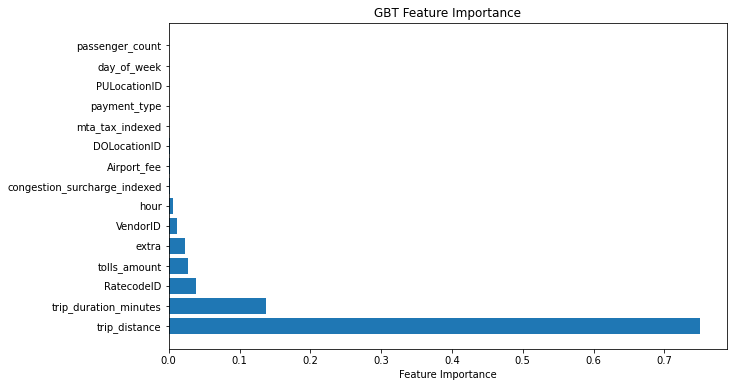

In [0]:
best_gbt_model = gbt_cv_model.bestModel.stages[-1]

# Get feature importances from the GBT model
feature_importances = best_gbt_model.featureImportances

# Sort features by importance
sorted_features = sorted(zip(features3, feature_importances), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_features)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(features, importances)
plt.xlabel("Feature Importance")
plt.title("GBT Feature Importance")
plt.show()

### Update features

In [0]:
features4 = ['VendorID',
    #'passenger_count',
    'RatecodeID',
    'PULocationID',
    'DOLocationID',
    #'payment_type',
    'mta_tax_indexed',
    'congestion_surcharge_indexed',
    'Airport_fee',
    'hour',
    #'day_of_week',
    'trip_distance',
    'extra',
    'tolls_amount',
    'trip_duration_minutes']

assembler4 = VectorAssembler(inputCols=features4, 
outputCol='features4')
df = assembler4.transform(df)

In [0]:
# Split data again
train_data, val_data, test_data = df.select(['features', 'features2', 'features3', 'features4', 'total_amount']).randomSplit([0.6, 0.2, 0.2], seed=42)
train_data.show(5, truncate=False)

In [0]:
# RF pipeline
rf = RandomForestRegressor(featuresCol="features4", labelCol="total_amount")

# Grid search
rf_paramGrid = (
    ParamGridBuilder()
    .addGrid(rf.numTrees, [20, 50])
    .addGrid(rf.maxDepth, [3, 5])
    .addGrid(rf.maxBins, [16, 32])
    .build()
)

mlflow.pyspark.ml.autolog() 

rf_pipeline = Pipeline(stages = [rf])
rf_cv = CrossValidator(
    estimator=rf_pipeline,
    estimatorParamMaps=rf_paramGrid,
    evaluator=evaluator_rmse,
    numFolds=3
)

with mlflow.start_run(run_name="RF_Model_features4"):
    rf_cv_model = rf_cv.fit(train_data)
    predictions = rf_cv_model.transform(val_data)

    # Log all tested parameter combinations
    for params, metric in zip(rf_cv_model.getEstimatorParamMaps(), rf_cv_model.avgMetrics):
        param_str = "_".join([f"{param.name}_{val}" for param, val in params.items()])
        mlflow.log_metric(f"cv_rmse_{param_str}", metric)

    # Evaluate 
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")

2025/05/21 16:19:34 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 16:20:13 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/a4a21dd0619647b78e54a3a7926c699a/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 
2025/05/21 16:20:22 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 16:21:07 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (mod

RMSE: 3.3492966479997985
R^2: 0.9661518965722007
MAE: 1.909184654792255


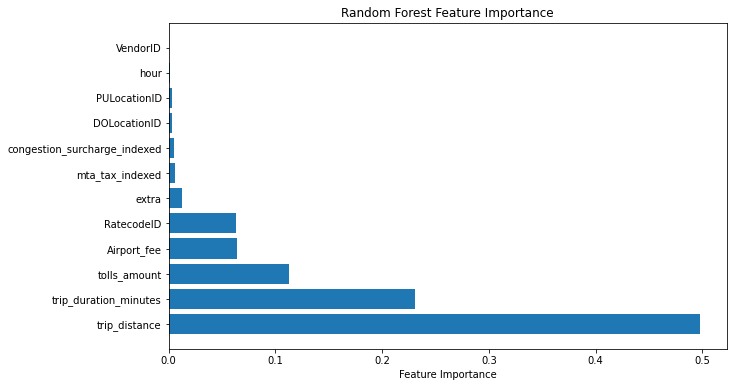

In [0]:
# Look into feature importance in random forest regression
best_rf_model = rf_cv_model.bestModel
rf_model = best_rf_model.stages[-1]

# Get feature importance from the Random Forest model
feature_importances = rf_model.featureImportances

# Sort features by importance
sorted_features = sorted(zip(features4, feature_importances), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_features)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(features, importances)
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importance")
plt.show()

In [0]:
# GBT pipeline
gbt = GBTRegressor(featuresCol="features4", labelCol="total_amount")
gbt_paramGrid = ParamGridBuilder().addGrid(gbt.maxDepth, [3, 5]).build()

# Create a Pipeline (gbt_pipeline)
gbt_pipeline = Pipeline(stages = [gbt])

mlflow.pyspark.ml.autolog() 

gbt_cv = CrossValidator(
    estimator=gbt_pipeline,
    estimatorParamMaps=gbt_paramGrid,
    evaluator=evaluator_rmse,
    numFolds=3
)

with mlflow.start_run(run_name="GBT_Model_features4"):
    gbt_cv_model = gbt_cv.fit(train_data)
    predictions = gbt_cv_model.transform(val_data)

    # Log all tested parameter combinations
    for params, metric in zip(gbt_cv_model.getEstimatorParamMaps(), gbt_cv_model.avgMetrics):
        param_str = "_".join([f"{param.name}_{val}" for param, val in params.items()])
        mlflow.log_metric(f"cv_rmse_{param_str}", metric)

    # Evaluate 
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    mae = evaluator_mae.evaluate(predictions)

    # Show results
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"MAE: {mae}")

    # Log best model
    # mlflow.spark.log_model(gbt_cv_model.bestModel, "gbt-best-model")

2025/05/21 16:40:40 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 16:41:20 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/587658695314602/2d46b3e3a1c44e9ba2b853719c817880/artifacts/model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 
2025/05/21 16:41:29 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/05/21 16:42:08 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (mod

RMSE: 2.4934821070495867
R^2: 0.9812397067821508
MAE: 1.3574496368261855


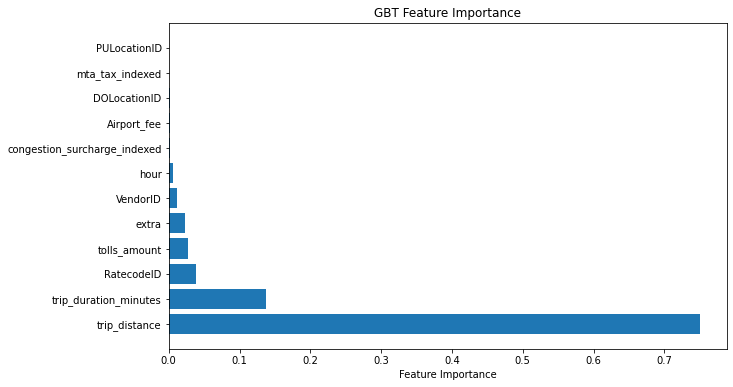

In [0]:
best_gbt_model = gbt_cv_model.bestModel.stages[-1]

# Get feature importances from the GBT model
feature_importances = best_gbt_model.featureImportances

# Sort features by importance
sorted_features = sorted(zip(features4, feature_importances), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_features)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(features, importances)
plt.xlabel("Feature Importance")
plt.title("GBT Feature Importance")
plt.show()

## Visualize

In [0]:
# Get predictions
predictions = best_rf_model.transform(test_data)

# Select actual and predicted values
results = predictions.select("total_amount", "prediction").toPandas()

In [0]:
rmse = evaluator_rmse.evaluate(predictions)
r2 = evaluator_r2.evaluate(predictions)
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

RMSE: 3.3167251457532805
R^2: 0.9670143340086064
MAE: 1.9162527035835506


In [0]:
rmse = evaluator_rmse.evaluate(predictions)
r2 = evaluator_r2.evaluate(predictions)
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

RMSE: 2.51630630887811
R^2: 0.9810140075770853
MAE: 1.3533609786589114


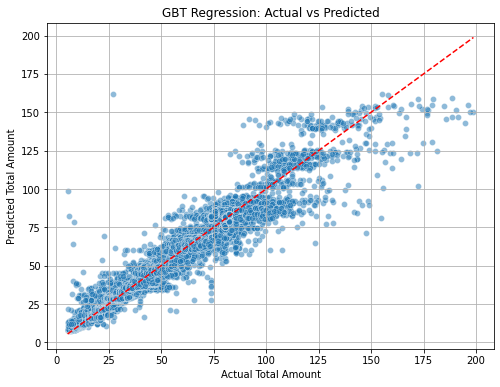

In [0]:
# Predicted vs Actual
plt.figure(figsize=(8, 6))
sns.scatterplot(data=results, x="total_amount", y="prediction", alpha=0.5)
plt.plot([results.total_amount.min(), results.total_amount.max()],
         [results.total_amount.min(), results.total_amount.max()],
         color='red', linestyle='--')
plt.xlabel("Actual Total Amount")
plt.ylabel("Predicted Total Amount")
plt.title("GBT Regression: Actual vs Predicted")
plt.grid(True)
plt.show()

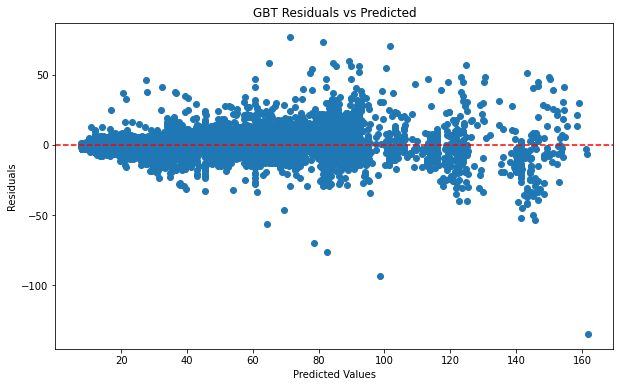

In [0]:
results["residuals"] = results["total_amount"] - results["prediction"]

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(results["prediction"], results["residuals"])
plt.axhline(0, color='red', linestyle="--")  # horizontal line at zero for reference
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("GBT Residuals vs Predicted")
plt.show()

## Old

In [0]:
"""
features2 = [trip_distance', "tolls_amount", "congestion_surcharge"]
features3 = ['trip_distance',
    #'is_holiday',
    #'is_weekend',
    #'month',
    'PULocationID',
    'DOLocationID',
    #'day_of_week',
    'hour',
    #'is_shared_ride',
    'Airport_fee',
    "tolls_amount",
    "congestion_surcharge"]

features4 =['trip_distance',
    #'is_holiday',
    #'is_weekend',
    #'month',
    'PULocationID',
    'DOLocationID',
    'day_of_week',
    'hour',
    'is_shared_ride',
    'Airport_fee',
    #"tolls_amount",
    #"congestion_surcharge"
    ]
features5 = ['trip_distance',
    #'is_holiday',
    #'is_weekend',
    #'month',
    'PULocationID',
    'DOLocationID',
    'day_of_week',
    'hour',
    'is_shared_ride',
    'Airport_fee',
    "tolls_amount",
    "congestion_surcharge_indexed"]

assembler4 = VectorAssembler(inputCols=features4, 
outputCol='features4')

assembler5 = VectorAssembler(inputCols=features5, 
outputCol='features5')

df = assembler4.transform(df)
df = assembler5.transform(df)
"""

In [0]:
rf = RandomForestRegressor(featuresCol="features", labelCol="total_amount") #6.76

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(val_data)

# Evaluate model
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)

evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")
r2 = evaluator_r2.evaluate(predictions)

evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

importances = model.featureImportances
print(features)
importances

RMSE: 6.662567305028118
R^2: 0.8989347218701603
MAE: 4.095107630033353
['trip_distance']


SparseVector(1, {0: 1.0})

In [0]:
rf = RandomForestRegressor(featuresCol="features2", labelCol="total_amount") 

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(val_data)

# Evaluate model
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)

evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")
r2 = evaluator_r2.evaluate(predictions)

evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

importances = model.featureImportances
print(features2)
importances

25/05/09 09:50:41 WARN MemoryStore: Not enough space to cache rdd_122_0 in memory! (computed 17.8 MiB so far)
25/05/09 09:50:41 WARN BlockManager: Persisting block rdd_122_0 to disk instead.
25/05/09 09:50:41 WARN MemoryStore: Not enough space to cache rdd_122_6 in memory! (computed 17.8 MiB so far)
25/05/09 09:50:41 WARN BlockManager: Persisting block rdd_122_6 to disk instead.
25/05/09 09:50:41 WARN MemoryStore: Not enough space to cache rdd_122_5 in memory! (computed 17.8 MiB so far)
25/05/09 09:50:41 WARN BlockManager: Persisting block rdd_122_5 to disk instead.
25/05/09 09:50:41 WARN MemoryStore: Not enough space to cache rdd_122_2 in memory! (computed 17.8 MiB so far)
25/05/09 09:50:41 WARN BlockManager: Persisting block rdd_122_2 to disk instead.
25/05/09 09:50:41 WARN MemoryStore: Not enough space to cache rdd_122_1 in memory! (computed 17.8 MiB so far)
25/05/09 09:50:41 WARN BlockManager: Persisting block rdd_122_1 to disk instead.
25/05/09 09:50:43 WARN MemoryStore: Not enoug

RMSE: 7.6569582669302445
R^2: 0.8665153530953524
MAE: 5.300072975862421
['trip_distance', 'tolls_amount', 'congestion_surcharge']


SparseVector(3, {0: 0.6081, 1: 0.3491, 2: 0.0428})

In [0]:
rf = RandomForestRegressor(featuresCol="features3", labelCol="total_amount") 

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(val_data)

# Evaluate model
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)

evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")
r2 = evaluator_r2.evaluate(predictions)

evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

importances = model.featureImportances
print(features3)
importances

25/05/09 09:56:03 WARN MemoryStore: Not enough space to cache rdd_189_1 in memory! (computed 12.5 MiB so far)
25/05/09 09:56:03 WARN BlockManager: Persisting block rdd_189_1 to disk instead.
25/05/09 09:56:03 WARN MemoryStore: Not enough space to cache rdd_189_4 in memory! (computed 19.2 MiB so far)
25/05/09 09:56:03 WARN BlockManager: Persisting block rdd_189_4 to disk instead.
25/05/09 09:56:03 WARN MemoryStore: Not enough space to cache rdd_189_0 in memory! (computed 19.2 MiB so far)
25/05/09 09:56:03 WARN BlockManager: Persisting block rdd_189_0 to disk instead.
25/05/09 09:56:04 WARN MemoryStore: Not enough space to cache rdd_189_7 in memory! (computed 19.2 MiB so far)
25/05/09 09:56:04 WARN BlockManager: Persisting block rdd_189_7 to disk instead.
25/05/09 09:56:04 WARN MemoryStore: Not enough space to cache rdd_189_5 in memory! (computed 19.2 MiB so far)
25/05/09 09:56:04 WARN BlockManager: Persisting block rdd_189_5 to disk instead.
25/05/09 09:56:05 WARN MemoryStore: Not enoug

RMSE: 6.422034531740836
R^2: 0.9061003378084036
MAE: 4.398919608280725
['trip_distance', 'PULocationID', 'DOLocationID', 'hour', 'Airport_fee', 'tolls_amount', 'congestion_surcharge']


SparseVector(7, {0: 0.7018, 1: 0.0167, 2: 0.0092, 3: 0.0025, 4: 0.118, 5: 0.1386, 6: 0.0131})

In [0]:
rf = RandomForestRegressor(featuresCol="features4", labelCol="total_amount") 

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(val_data)

# Evaluate model
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)

evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")
r2 = evaluator_r2.evaluate(predictions)

evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

importances = model.featureImportances
print(features4)
importances

25/05/09 10:00:30 WARN MemoryStore: Not enough space to cache rdd_256_3 in memory! (computed 29.6 MiB so far)
25/05/09 10:00:30 WARN BlockManager: Persisting block rdd_256_3 to disk instead.
25/05/09 10:00:30 WARN MemoryStore: Not enough space to cache rdd_256_5 in memory! (computed 5.5 MiB so far)
25/05/09 10:00:30 WARN BlockManager: Persisting block rdd_256_5 to disk instead.
25/05/09 10:00:30 WARN MemoryStore: Not enough space to cache rdd_256_6 in memory! (computed 5.5 MiB so far)
25/05/09 10:00:30 WARN BlockManager: Persisting block rdd_256_6 to disk instead.
25/05/09 10:00:30 WARN MemoryStore: Not enough space to cache rdd_256_7 in memory! (computed 12.5 MiB so far)
25/05/09 10:00:30 WARN BlockManager: Persisting block rdd_256_7 to disk instead.
25/05/09 10:00:30 WARN MemoryStore: Not enough space to cache rdd_256_2 in memory! (computed 29.6 MiB so far)
25/05/09 10:00:30 WARN BlockManager: Persisting block rdd_256_2 to disk instead.
25/05/09 10:00:30 WARN MemoryStore: Not enough 

RMSE: 7.128674313452043
R^2: 0.8842992153591688
MAE: 4.796749555245086
['trip_distance', 'PULocationID', 'DOLocationID', 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee']


SparseVector(7, {0: 0.7742, 1: 0.0054, 2: 0.0281, 3: 0.0003, 4: 0.0057, 5: 0.0, 6: 0.1863})

In [0]:
rf = RandomForestRegressor(featuresCol="features5", labelCol="total_amount") 

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(val_data)

# Evaluate model
evaluator_rmse = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)

evaluator_r2 = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="r2")
r2 = evaluator_r2.evaluate(predictions)

evaluator_mae = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="mae")
mae = evaluator_mae.evaluate(predictions)

# Show results
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"MAE: {mae}")

importances = model.featureImportances
print(features5)
importances

25/05/09 10:05:14 WARN MemoryStore: Not enough space to cache rdd_323_5 in memory! (computed 18.0 MiB so far)
25/05/09 10:05:14 WARN BlockManager: Persisting block rdd_323_5 to disk instead.
25/05/09 10:05:14 WARN MemoryStore: Not enough space to cache rdd_323_4 in memory! (computed 18.0 MiB so far)
25/05/09 10:05:14 WARN BlockManager: Persisting block rdd_323_4 to disk instead.
25/05/09 10:05:15 WARN MemoryStore: Not enough space to cache rdd_323_1 in memory! (computed 11.7 MiB so far)
25/05/09 10:05:15 WARN BlockManager: Persisting block rdd_323_1 to disk instead.
25/05/09 10:05:15 WARN MemoryStore: Not enough space to cache rdd_323_7 in memory! (computed 11.7 MiB so far)
25/05/09 10:05:15 WARN BlockManager: Persisting block rdd_323_7 to disk instead.
25/05/09 10:05:15 WARN MemoryStore: Not enough space to cache rdd_323_0 in memory! (computed 27.1 MiB so far)
25/05/09 10:05:15 WARN BlockManager: Persisting block rdd_323_0 to disk instead.
25/05/09 10:05:15 WARN MemoryStore: Not enoug

RMSE: 7.359492320290111
R^2: 0.8766854081503659
MAE: 5.189811520458111
['trip_distance', 'PULocationID', 'DOLocationID', 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee', 'tolls_amount', 'congestion_surcharge']


SparseVector(9, {0: 0.5195, 1: 0.0096, 2: 0.016, 3: 0.0005, 4: 0.0025, 5: 0.0, 6: 0.1458, 7: 0.2829, 8: 0.0233})

## Old

In [0]:
# Predict with pu, do locations + 'trip_distance', 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee'
predictions2 = model2.transform(test_data)

# Evaluate
evaluator = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions2)
print(f"RMSE: {rmse:.2f}")

RMSE: 6.94


In [0]:
# Extract feature importances
# 'trip_distance', pu, do, 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee'
importances = model2.featureImportances
importances

SparseVector(7, {0: 0.6591, 1: 0.024, 2: 0.0155, 3: 0.0002, 4: 0.0063, 5: 0.0, 6: 0.295})

In [0]:
# Predict with 'trip_distance', 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee'
predictions2 = model2.transform(test_data)

# Evaluate
evaluator = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions2)
print(f"RMSE: {rmse:.2f}")

RMSE: 7.69


In [0]:
# Extract feature importances
# 'trip_distance', 'day_of_week', 'hour', 'is_shared_ride', 'Airport_fee'
importances = model2.featureImportances
importances

SparseVector(5, {0: 0.6799, 1: 0.0018, 2: 0.012, 3: 0.0002, 4: 0.3061})

In [0]:
# Predict with many features
predictions2 = model2.transform(test_data)

# Evaluate
evaluator = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions2)
print(f"RMSE: {rmse:.2f}")

RMSE: 7.85


In [0]:
rf = RandomForestRegressor(featuresCol="features2", labelCol="total_amount")

# Train
model = rf.fit(train_data)

# Predict
predictions = model.transform(test_data)

# Evaluate
evaluator = RegressionEvaluator(labelCol="total_amount", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions)
print(f"RMSE: {rmse:.2f}")

importances = model.featureImportances
importances

25/05/08 12:21:24 WARN MemoryStore: Not enough space to cache rdd_581_7 in memory! (computed 5.1 MiB so far)
25/05/08 12:21:24 WARN BlockManager: Persisting block rdd_581_7 to disk instead.
25/05/08 12:21:24 WARN MemoryStore: Not enough space to cache rdd_581_4 in memory! (computed 5.1 MiB so far)
25/05/08 12:21:24 WARN BlockManager: Persisting block rdd_581_4 to disk instead.
25/05/08 12:21:24 WARN MemoryStore: Not enough space to cache rdd_581_1 in memory! (computed 5.1 MiB so far)
25/05/08 12:21:24 WARN BlockManager: Persisting block rdd_581_1 to disk instead.
25/05/08 12:21:24 WARN MemoryStore: Not enough space to cache rdd_581_0 in memory! (computed 5.1 MiB so far)
25/05/08 12:21:24 WARN BlockManager: Persisting block rdd_581_0 to disk instead.
25/05/08 12:21:24 WARN MemoryStore: Not enough space to cache rdd_581_3 in memory! (computed 5.1 MiB so far)
25/05/08 12:21:24 WARN BlockManager: Persisting block rdd_581_3 to disk instead.
25/05/08 12:21:24 WARN MemoryStore: Not enough spa

RMSE: 7.23


SparseVector(9, {0: 0.4414, 1: 0.0141, 2: 0.0151, 3: 0.0003, 4: 0.0043, 5: 0.0, 6: 0.3087, 7: 0.2018, 8: 0.0144})

In [0]:
# 'trip_distance', 'PULocationID', 'DOLocationID', 'day_of_week', 'hour', 
# 'is_shared_ride', 'Airport_fee', "tolls_amount", "congestion_surcharge"